## Mandelbrot Set
***

### Requirements

In [1]:
import numpy as np
from tqdm import tqdm
from keras.preprocessing.image import array_to_img
import matplotlib.pyplot as plt

### Chose window

In [8]:
# # Mandelbrot
# re_c = -0.75
# im_c = 0
# zoom = 1

# Julia Island
# re_c = -1.768778825 # -0.75
# im_c = -0.001738921  # 0
# zoom = 3000000

# # Seahorse island
# re_c = -0.743235616
# im_c = -0.126847639
# zoom = 300

# Sun
re_c = -0.776592847
im_c = -0.136640848
zoom = 400000
    
# Compute axes limits
re_min = re_c - (1.55 / zoom)
re_max = re_c + (1.55 / zoom)
im_min = im_c - (1.55 / zoom)
im_max = im_c + (1.55 / zoom)
limits = [re_min, re_max, im_min, im_max]

print('Real axes are {}, {}'.format(re_min, re_max))
print('Imaginary axes are {}, {}'.format(im_min, im_max))


Real axes are -0.776596722, -0.776588972
Imaginary axes are -0.136644723, -0.13663697300000002


### Create image array

In [9]:
def create_img_array(px: int, py: int):
    # Check pixel ratio
    ratio = px/py
    if ratio != 4/3:
        py = int(px * 3 / 4)
        print('Pixel ratio inserted is not 4/3. Image will be resized to ({}, {})'.format(px, py))
    # Create image array
    array = np.zeros((py, px, 1))
    return array

x_pixels = 1920
y_pixels = 1440
img_array = create_img_array(x_pixels, y_pixels)
print('Done! Image size (height, width, channels): {}'.format(img_array.shape))

Done! Image size (height, width, channels): (1440, 1920, 1)


### Generate Mandelbrot set

In [10]:
def mandelbrot(array, limits, max_it, thres):
    # Get width and height
    w = array.shape[1]
    h = array.shape[0]
    # Get limits from portion data [Re_center, Im_center, zoom]
    re_min = limits[0]
    re_max = limits[1]
    im_min = limits[2]
    im_max = limits[3]
    # Iterate over pixels
    for x in tqdm(range(w)):
        for y in range(h):
            # Map a and b relative to x and y
            a = ((re_max - re_min) / w) * x + re_min
            b = ((im_max - im_min) / h) * y + im_min
            # Save initial point parameters
            ca = a
            cb = b
            # Start Mandelbrot iteration
            it = 0
            conj = 0
            color = 0
            while it < max_it:
                # Compute this iteration parameters
                aa = a * a - b * b + ca
                bb = 2 * a * b + cb
                # Save parameters for next iteration
                a = aa
                b = bb
                # Break if point went to infinity
                if conj > thres:
                    color = ((255 / max_it) * it)
                    break
                conj = (a * a) + (b * b)
                it += 1
            img_array[y, x, :] = color
    # Return image
    return img_array

max_iterations = 350
threshold = 4
print('Generating Mandelbrot set in image size {}'.format(img_array.shape))
mdt = mandelbrot(img_array, limits, max_iterations, threshold)
print('Done!')

Generating Mandelbrot set in image size (1440, 1920, 1)


100%|██████████████████████████████████████████████████████████████████████████████| 1920/1920 [05:13<00:00,  6.13it/s]

Done!


### Create figure

Converting data array to image...


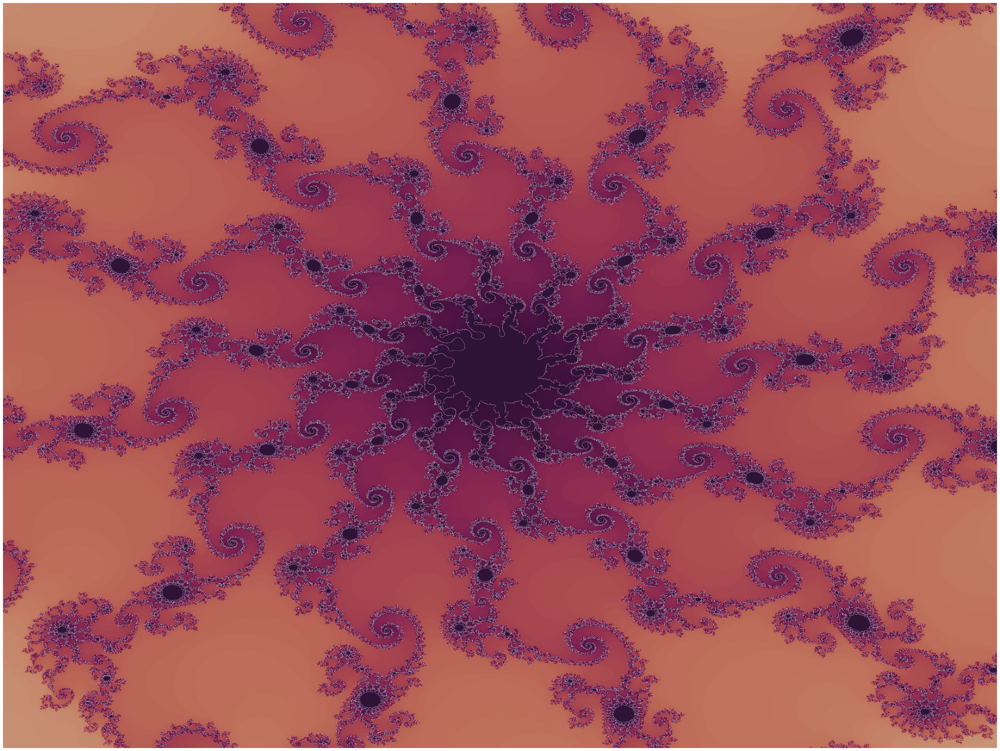

In [16]:
def create_figure(array, dpi=None, cmap='magma_r'):
    # Convert img data array to image
    print('Converting data array to image...')
    img_pil = array_to_img(array)

    # Choose DPI
    if dpi is None:
        dpi = matplotlib.rcParams['savefig.dpi']
    dpi = float(dpi)

    # Create figure and add axes
    h = 4000 / dpi
    w = 3000 / dpi
    fig = plt.figure(figsize=(h, w), dpi=dpi, frameon=False)
    ax = fig.add_axes([0, 0, 1, 1])
    ax.axis('off')

    # Plot image from data array
    ax.imshow(img_pil, cmap=cmap, vmin=0, vmax=255)

    # Remove axes from plot
    ax.axis('off')

    # Return image
    return fig

dpi = 120
colormap = 'twilight_shifted'
fig = create_figure(mdt, dpi, colormap)
# plot(fig)

### Save figure

In [17]:
name = 'Mandelbrot'
fig.savefig(r'imgs/sun.png'.format(name, x_pixels, y_pixels, max_iterations), format='png', dpi=100)
print('Done!')

Done!
